In [1]:
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, roc_auc_score
import pandas as pd
import cupy as cp
from sklearn.naive_bayes import GaussianNB as sk_gnb
from cuml.naive_bayes import GaussianNB as cu_gnb
from cuml.ensemble import RandomForestClassifier as cu_rfc
from sklearn.ensemble import RandomForestClassifier as sk_rfc
import numpy as np
from sklearn.feature_selection import SelectFromModel
from cuml.linear_model import LogisticRegression as cu_lr
from imblearn.over_sampling import ADASYN
import optuna
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.metrics import precision_score
from cuml.svm import LinearSVC as cu_svc
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_validate
import cudf
import joblib
import os
import cupy as cp
import gc
from sklearn.naive_bayes import GaussianNB

# Classification Models

We want to train our models to predict whether a client will default on a loan. This is a binary classification problem.

For the model building, firstly we are going to use SelectFromModel to select the most important features for each model. For the hyperparameter tuning we will use Optuna. It is a framework that will save us a lot of computational time. In addition, optuna uses a Bayesian optimization algorithm that will effectively find the most effective hyperparameter configuration. When we are using Optuna, we need to define an objective function that will be optimized by the framework. In our case, we are going to optimize the ROC AUC score, Precision and Recall which will be measured using a cross validation with cross_val_score. Finally, Optuna will return the best hyperparameters for the model. Since we have the best hyperparameters for the model, we will train the model with these hyperparameters and evaluate the model using the test set. At first, in the Optuna optimization we only tried to maximize the ROC AUC score, which gave good results on that metric but the models were not good generalizing.

For the evaluation, we are going to use the following metrics: accuracy, error rate, recall, sensitivity, precision, F1 score and ROC AUC score. We are going to use the ClassificationMetricsCV class to compute these metrics.

It is important to mention that we are using ADASYN algorithm to balance the dataset. This algorithm generates synthetic data from the one existing.

In [2]:
class ClassificationMetricsCV:
    results_df = pd.DataFrame()

    def __init__(self, model, X, y):
        self.accuracy = []
        self.error_rate = []
        self.recall = []
        self.precision = []
        self.f1_score = []
        self.roc_auc = []
        self.model = model

        if isinstance(X, cp.ndarray):
            X = X.get()

        if isinstance(X, cudf.DataFrame):
            X = X.to_pandas()

        self.X = pd.DataFrame(X).reset_index(drop=True)

        if isinstance(y, cp.ndarray):
            y = y.get()

        if isinstance(y, cudf.Series):
            y = y.to_pandas()

        self.y = pd.Series(y).reset_index(drop=True)

    def compute_metrics(self, y_test, y_pred):
        # Accuracy
        acc = accuracy_score(y_test, y_pred)
        self.accuracy.append(acc)

        # Error rate (1 - accuracy)
        error_rate = 1 - acc
        self.error_rate.append(error_rate)

        # Recall
        recall = recall_score(y_test, y_pred, average='binary')
        self.recall.append(recall)

        # Precision
        precision = precision_score(y_test, y_pred, average='binary')
        self.precision.append(precision)

        # F1 score
        f1_score_result = f1_score(y_test, y_pred, average='binary')
        self.f1_score.append(f1_score_result)

        # ROC AUC score
        roc_auc = roc_auc_score(y_test, y_pred)
        self.roc_auc.append(roc_auc)

    def stratifiedKfold(self):
        skf = StratifiedKFold(n_splits=10, random_state=42,shuffle=True)
        for train_index, test_index in skf.split(self.X,self.y):

            X_train = self.X.iloc[train_index, :]
            X_test = self.X.iloc[test_index, :]
            y_train = self.y[train_index]
            y_test = self.y[test_index]

            self.model.fit(X_train.to_numpy(), y_train)
            y_pred = self.model.predict(X_test)

            self.compute_metrics(y_test,y_pred)

    def save_results(self,algorithm):
        results = {
            "Algorithm": algorithm,
            "accuracy": round(np.mean(self.accuracy), 4),
            "error_rate": round(np.mean(self.error_rate), 4),
            "recall": round(np.mean(self.recall), 4),
            "precision": round(np.mean(self.precision), 4),
            "f1_score": round(np.mean(self.f1_score), 4),
            "roc_auc": round(np.mean(self.roc_auc), 4),
        }
        ClassificationMetricsCV.results_df = pd.concat(
            [ClassificationMetricsCV.results_df, pd.DataFrame([results])],
            ignore_index=True
        )

    def printMetrics(self):
        print(f"accuracy: {round(np.mean(self.accuracy), 4)}")
        print(f"error_rate: {round(np.mean(self.error_rate), 4)}")
        print(f"recall: {round(np.mean(self.recall), 4)}")
        print(f"precision: {round(np.mean(self.precision), 4)}")
        print(f"f1_score: {round(np.mean(self.f1_score), 4)}")
        print(f"roc_auc: {round(np.mean(self.roc_auc), 4)}")

    def save_model(self, path):
        directory = os.path.dirname(path)
        if not os.path.exists(directory):
            os.makedirs(directory)
        joblib.dump(self.model, path)

    @staticmethod
    def printResults():
        styled_df = (ClassificationMetricsCV.results_df.style
                     .set_table_styles([  # Estilo de la tabla
                         {'selector': 'th',
                          'props': [('background-color', '#f0f0f0'),
                                    ('font-weight', 'bold'),
                                    ('text-align', 'center'),
                                    ('color', 'black')]},
                         {'selector': 'td',
                          'props': [('text-align', 'center'),
                                    ('background-color', '#f0f0f0'),
                                    ('color', 'black')]},
                         {'selector': 'td:nth-child(1)',
                          'props': [('background-color', '#f0f0f0'),
                                    ('font-weight', 'bold')]}])
                     .format("{:.4f}", subset=ClassificationMetricsCV.results_df.columns.drop('Algorithm'))
                     )

        display(styled_df.hide(axis='index'))




First, we are going to load the data.

In [3]:
df = pd.read_parquet('../data/processed/selected_features_df.parquet')

X = df.drop(columns=['TARGET'])
y = df['TARGET']

We are going to split the data into training and testing sets, and scale the data using the StandardScaler.

In [4]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

## Logistic Regression

SelectFromModel for selecting features for Logistic Regression


In [5]:
logisticRegression = cu_lr()
selector = SelectFromModel(estimator=logisticRegression).fit(X_scaled, y)
X_selected = selector.transform(X_scaled)

Balancing the dataset using ADASYN


In [6]:
adasyn = ADASYN()
X_resampled, y_resampled = adasyn.fit_resample(X_selected, y)

#### HYPERPARAMETER TUNING

In [8]:
def objective(trial):
    C = trial.suggest_float('C', 1e-4, 1, log = True)
    max_iter = trial.suggest_int('max_iter', 100, 10000)
    class_weight = trial.suggest_categorical('class_weight', ['balanced', None])
    
    logisticRegression = cu_lr(C=C, max_iter=max_iter, class_weight=class_weight)    
    scoring = {'roc_auc': 'roc_auc', 'precision': 'precision', 'recall': 'recall'}
    cv_results = cross_validate(
        logisticRegression,
        X_resampled,
        y_resampled,
        cv=5,
        scoring=scoring,
        return_train_score=False
    )

    mean_roc_auc = cv_results['test_roc_auc'].mean()
    mean_precision = cv_results['test_precision'].mean()
    mean_recall = cv_results['test_recall'].mean()

    metric = np.mean([mean_roc_auc, mean_precision, mean_recall])

    return metric

study = optuna.create_study(direction='maximize', study_name="logistic_regression")
study.optimize(objective, n_trials=50)

[I 2024-12-22 17:09:21,707] A new study created in memory with name: logistic_regression
[I 2024-12-22 17:09:22,590] Trial 0 finished with value: 0.6532343066487464 and parameters: {'C': 0.00012287075992166593, 'max_iter': 4514, 'class_weight': 'balanced'}. Best is trial 0 with value: 0.6532343066487464.
[I 2024-12-22 17:09:25,536] Trial 1 finished with value: 0.6651680235626601 and parameters: {'C': 0.911052425173574, 'max_iter': 6011, 'class_weight': None}. Best is trial 1 with value: 0.6651680235626601.
[I 2024-12-22 17:09:26,668] Trial 2 finished with value: 0.6578897994668658 and parameters: {'C': 0.005142247050168536, 'max_iter': 3107, 'class_weight': 'balanced'}. Best is trial 1 with value: 0.6651680235626601.
[I 2024-12-22 17:09:27,740] Trial 3 finished with value: 0.6569713809311338 and parameters: {'C': 0.0018434191802104724, 'max_iter': 1826, 'class_weight': 'balanced'}. Best is trial 1 with value: 0.6651680235626601.
[I 2024-12-22 17:09:28,593] Trial 4 finished with value: 

#### METRICS

In [13]:
model = cu_lr(**study.best_params)
lr_metrics = ClassificationMetricsCV(model,X_resampled,y_resampled)
lr_metrics.save_model("../models/logistic_regression.pkl")

Train the model with the best found hyperparameters and compute the evaluation metrics with the test set.


In [7]:
# Load model
model = joblib.load("../models/logistic_regression.pkl")
metrics = ClassificationMetricsCV(model,X_resampled,y_resampled)
metrics.stratifiedKfold()
metrics.save_results("Logistic Regression")
metrics.printMetrics()

accuracy: 0.6479
error_rate: 0.3521
recall: 0.6453
precision: 0.6502
f1_score: 0.6477
roc_auc: 0.6479


We have balanced the dataset before and this makes the accuracy score a better metric to test the results of our model. The accuracy score in this case is 0.64 which is a moderate score with room for improvement. The recall in this model suggests that we are loosing a 35% of true samples. In the case of our dataset this is a big problem because if we find a false negative we could be giving a loan to a person who is going to default on it. The precision is not as important as recall because if there is less risk if we predict that a person who will not default on a loan defaults on it. The ROC AUC score indicates that our model is considerately better than predicting at random but it cannot be considered as usefull.

#### STUDY RESULTS

In [15]:
optuna.visualization.plot_optimization_history(study)

As we can se in this plot, there is not a big improvement from trial 10 ahead.

In [16]:
optuna.visualization.plot_parallel_coordinate(study)

The darker lines show the best results so we can see that best configurations have a high value of C. We find more good values when class_weight is balanced than when it is none, however, we can also find good results in that case. When it comes to max iterations, the results are better when the number is lower.

In [17]:
optuna.visualization.plot_param_importances(study)

As we can see, the most influential hyperparemeter is C, max_iter and class_weight are almost irrelevant.

## Random Forest

SelectFromModel to select features for RandomForestClassifier

In [8]:
rf_classifier = sk_rfc()
selector = SelectFromModel(estimator=rf_classifier).fit(X_scaled, y)
X_selected = selector.transform(X_scaled)

Balancing the dataset using ADASYN

In [9]:
adasyn = ADASYN()
X_resampled, y_resampled = adasyn.fit_resample(X_selected, y)

#### HYPERPARAMETER TUNING

In [16]:
def objective(trial):
    gc.collect()
    cp._default_memory_pool.free_all_blocks()
    param = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 500),
        'max_depth': trial.suggest_int('max_depth', 3, 30),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 20),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 20),
        'bootstrap': trial.suggest_categorical('bootstrap', [True, False])
    }

    random_forest_classifier = cu_rfc(**param)
    X_resampled_32 = X_resampled.astype(np.float32)

    scoring = {'roc_auc': 'roc_auc', 'precision': 'precision', 'recall': 'recall'}
    cv_results = cross_validate(
        random_forest_classifier,
        X_resampled_32,
        y_resampled,
        cv=5,
        scoring=scoring,
        return_train_score=False
    )

    mean_roc_auc = cv_results['test_roc_auc'].mean()
    mean_precision = cv_results['test_precision'].mean()
    mean_recall = cv_results['test_recall'].mean()

    metric = np.mean([mean_roc_auc, mean_precision, mean_recall])

    return metric

study = optuna.create_study(direction='maximize', study_name="random_forest")
study.optimize(objective, n_trials=20)

[I 2024-12-22 17:30:04,427] A new study created in memory with name: random_forest
[I 2024-12-22 17:30:51,789] Trial 0 finished with value: 0.9208328359150348 and parameters: {'n_estimators': 457, 'max_depth': 26, 'min_samples_split': 17, 'min_samples_leaf': 9, 'bootstrap': False}. Best is trial 0 with value: 0.9208328359150348.
[I 2024-12-22 17:31:11,839] Trial 1 finished with value: 0.8037227487739459 and parameters: {'n_estimators': 331, 'max_depth': 10, 'min_samples_split': 7, 'min_samples_leaf': 5, 'bootstrap': True}. Best is trial 0 with value: 0.9208328359150348.
[I 2024-12-22 17:31:30,020] Trial 2 finished with value: 0.8738282310602798 and parameters: {'n_estimators': 262, 'max_depth': 16, 'min_samples_split': 3, 'min_samples_leaf': 5, 'bootstrap': False}. Best is trial 0 with value: 0.9208328359150348.
[I 2024-12-22 17:31:52,686] Trial 3 finished with value: 0.8735798917259695 and parameters: {'n_estimators': 332, 'max_depth': 16, 'min_samples_split': 15, 'min_samples_leaf': 

In [17]:
model = cu_rfc(**study.best_params)
metrics = ClassificationMetricsCV(model,X_resampled,y_resampled)
metrics.save_model("../models/randomForestClassifier.pkl")

In [10]:
X_resampled_32 = X_resampled.astype(np.float32)

model = joblib.load("../models/randomForestClassifier.pkl")
metrics = ClassificationMetricsCV(model,X_resampled_32,y_resampled)
metrics.stratifiedKfold()
metrics.save_results("Random Forest")
metrics.printMetrics()

accuracy: 0.9614
error_rate: 0.0386
recall: 0.951
precision: 0.9716
f1_score: 0.9612
roc_auc: 0.9614


This metrics show an extremely good performance of our model. Almost all the predictions are correct and the goodness of our model is also supported by the rest of the metrics. This model is very useful.

#### STUDY RESULTS

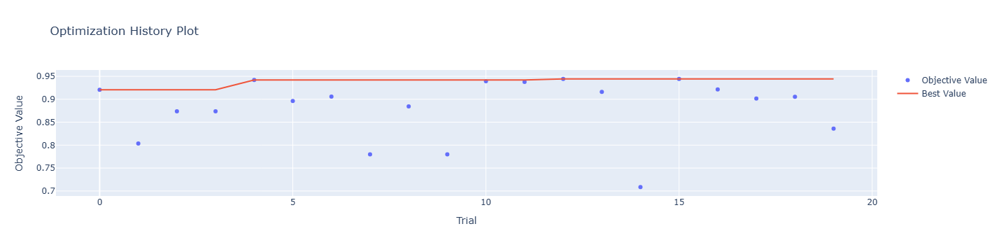

In [21]:
optuna.visualization.plot_optimization_history(study)

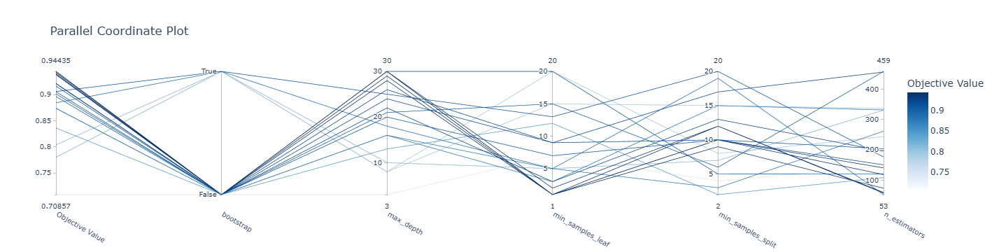

In [22]:
optuna.visualization.plot_parallel_coordinate(study)

In this plot. where darker lines show better objective function results we can see that best result is the one with the highest number of estimators and bootstrap set to false.

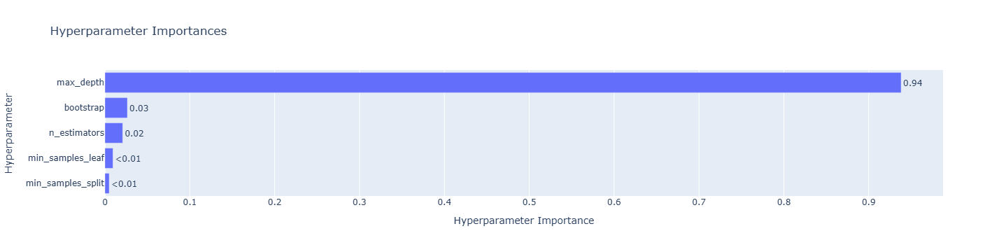

In [23]:
optuna.visualization.plot_param_importances(study)

The most important hyperparameter is max_depth and results are better with higher values. This makes sense because of the high dimensionality of the dataset, trees need to expand a lot.

## Naive Bayes

We will not use SelectFromModel since naive bayes is a generative model that does not learn feature importance like other models do.

Balancing the dataset 

In [11]:
adasyn = ADASYN()
X_resampled, y_resampled = adasyn.fit_resample(X_scaled, y)

#### HYPERPARAMETER TUNING

In [6]:
def objective(trial):
    gc.collect()
    cp._default_memory_pool.free_all_blocks()

    prior1 = trial.suggest_float('prior1', 0.0, 1.0)
    prior2 = 1.0 - prior1
    priors = cp.array([prior1, prior2])

    gnb_classifier = cu_gnb(priors=priors)

    scoring = {'roc_auc': 'roc_auc', 'precision': 'precision', 'recall': 'recall'}
    cv_results = cross_validate(
        gnb_classifier,
        X_resampled,
        y_resampled,
        cv=5,
        scoring=scoring,
        return_train_score=False
    )

    mean_roc_auc = cv_results['test_roc_auc'].mean()
    mean_precision = cv_results['test_precision'].mean()
    mean_recall = cv_results['test_recall'].mean()

    metric = np.mean([mean_roc_auc, mean_precision, mean_recall])

    return metric

study = optuna.create_study(direction='maximize',study_name="Naive Bayes")
study.optimize(objective, n_trials=50)
print(study.best_params)

[I 2024-12-22 17:46:38,063] A new study created in memory with name: Naive Bayes
[I 2024-12-22 17:46:40,889] Trial 0 finished with value: 0.6525120738535389 and parameters: {'prior1': 0.7219117285381329}. Best is trial 0 with value: 0.6525120738535389.
[I 2024-12-22 17:46:42,937] Trial 1 finished with value: 0.6754980762488394 and parameters: {'prior1': 0.17667686043914244}. Best is trial 1 with value: 0.6754980762488394.
[I 2024-12-22 17:46:44,988] Trial 2 finished with value: 0.6596926424661771 and parameters: {'prior1': 0.5666422098124007}. Best is trial 1 with value: 0.6754980762488394.
[I 2024-12-22 17:46:44,511] Trial 3 finished with value: 0.6575552622100168 and parameters: {'prior1': 0.6175179828878161}. Best is trial 1 with value: 0.6754980762488394.
[I 2024-12-22 17:46:46,590] Trial 4 finished with value: 0.6564308543155707 and parameters: {'prior1': 0.6404895121866633}. Best is trial 1 with value: 0.6754980762488394.
[I 2024-12-22 17:46:48,621] Trial 5 finished with value: 0

{'prior1': 0.0013005326999492436}


First, we need to compute the two priors

In [7]:
prior1 = study.best_params['prior1']
prior2 = 1-prior1
priors = np.array([prior1, prior2])

#### METRICS

Finally, we train the model and compute all the metrics. As we are having strange issues to compute the metrics with the CUML model, we are going to compute the metrics using the GaussianNB class, from SKLearn-

In [8]:
model = GaussianNB(priors = priors)
metrics = ClassificationMetricsCV(model,X_resampled,y_resampled)
metrics.save_model("../models/naiveBayesClassifier.pkl")

In [12]:
model = joblib.load("../models/naiveBayesClassifier.pkl")
metrics = ClassificationMetricsCV(model,X_resampled,y_resampled)
metrics.stratifiedKfold()
metrics.save_results("Naive Bayes")
metrics.printMetrics()

accuracy: 0.5994
error_rate: 0.4006
recall: 0.8744
precision: 0.5639
f1_score: 0.6856
roc_auc: 0.5996


The performance of this model in general terms is not good. Yet, the recall is remarkable, and in the context we are facing, where we want the less false positives possible an 84% of recall makes the model somehow useful.

#### STUDY RESULTS

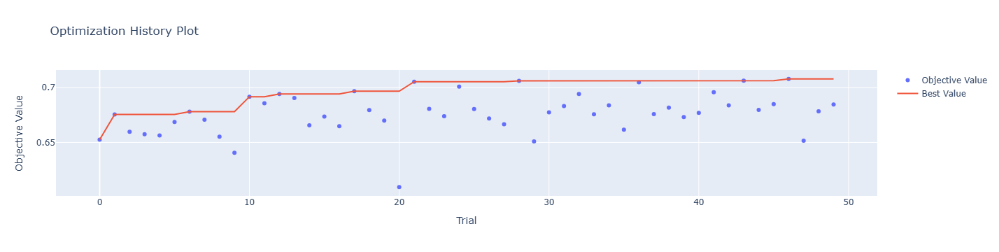

In [11]:
optuna.visualization.plot_optimization_history(study)

## Linear SVC

In [13]:
svm_classifier = cu_svc()
selector = SelectFromModel(estimator=svm_classifier).fit(X_scaled, y)
X_selected = selector.transform(X_scaled)

In [14]:
adasyn = ADASYN()
X_resampled, y_resampled = adasyn.fit_resample(X_selected, y)

#### HYPERPARAMETER TUNING

In [16]:
def objective(trial):
    gc.collect()
    cp._default_memory_pool.free_all_blocks()

    C = trial.suggest_float('C', 1e-5, 1e2,log=True)
    tol = trial.suggest_float('tol', 1e-5, 1e-1, log=True)
    max_iter = trial.suggest_int('max_iter', 100, 1000)
    loss = trial.suggest_categorical('loss', ['hinge', 'squared_hinge'])

    svm_classifier = cu_svc(C=C, tol=tol, max_iter=max_iter, loss=loss)

    scoring = {'roc_auc': 'roc_auc', 'precision': 'precision', 'recall': 'recall'}
    cv_results = cross_validate(
        svm_classifier,
        X_resampled,
        y_resampled,
        cv=5,
        scoring=scoring,
        return_train_score=False
    )

    mean_roc_auc = cv_results['test_roc_auc'].mean()
    mean_precision = cv_results['test_precision'].mean()
    mean_recall = cv_results['test_recall'].mean()

    metric = np.mean([mean_roc_auc, mean_precision, mean_recall])

    return metric

study = optuna.create_study(direction='maximize', study_name="svm")
study.optimize(objective, n_trials=100)

[I 2024-12-22 17:50:11,005] A new study created in memory with name: svm
[I 2024-12-22 17:50:12,265] Trial 0 finished with value: 0.6891122411529947 and parameters: {'C': 0.002664847203988818, 'tol': 0.0002236565015736715, 'max_iter': 428, 'loss': 'squared_hinge'}. Best is trial 0 with value: 0.6891122411529947.
[I 2024-12-22 17:50:10,509] Trial 1 finished with value: 0.6891040407688237 and parameters: {'C': 0.4610927184691593, 'tol': 0.0005613803710599703, 'max_iter': 863, 'loss': 'squared_hinge'}. Best is trial 0 with value: 0.6891122411529947.
[I 2024-12-22 17:50:11,577] Trial 2 finished with value: 0.6941165403951369 and parameters: {'C': 0.0005077890984369522, 'tol': 6.218446379107724e-05, 'max_iter': 130, 'loss': 'hinge'}. Best is trial 2 with value: 0.6941165403951369.
[I 2024-12-22 17:50:12,547] Trial 3 finished with value: 0.6919533022474452 and parameters: {'C': 3.2231719796060304e-05, 'tol': 0.009062199267538542, 'max_iter': 868, 'loss': 'hinge'}. Best is trial 2 with value:

#### METRICS

In [18]:
model = cu_svc(**study.best_params)
metrics = ClassificationMetricsCV(model,X_resampled,y_resampled)
metrics.save_model("../models/linearSVC.pkl")

In [15]:
model = joblib.load("../models/linearSVC.pkl")
metrics = ClassificationMetricsCV(model,X_resampled,y_resampled)
metrics.stratifiedKfold()
metrics.save_results("Linear SVC")
metrics.printMetrics()

accuracy: 0.6728
error_rate: 0.3272
recall: 0.6869
precision: 0.6704
f1_score: 0.6786
roc_auc: 0.6727


This model shows moderate performance metrics in all the scores. This model cannot be considered as useful for our purpose.

#### STUDY RESULTS

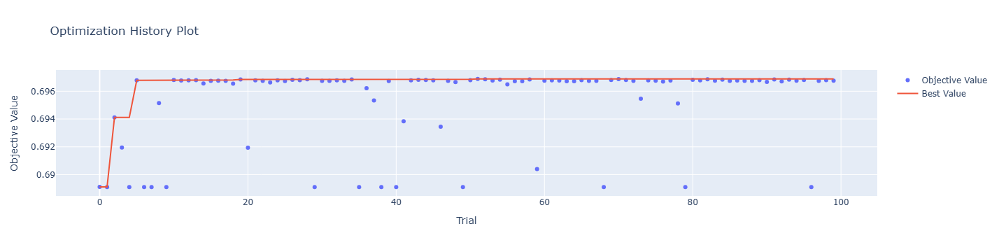

In [20]:
optuna.visualization.plot_optimization_history(study)

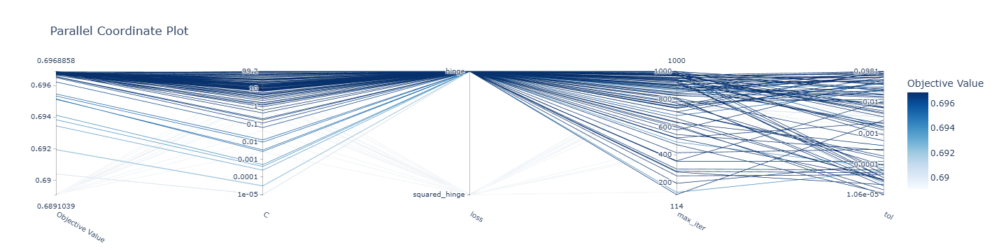

In [21]:
optuna.visualization.plot_parallel_coordinate(study)

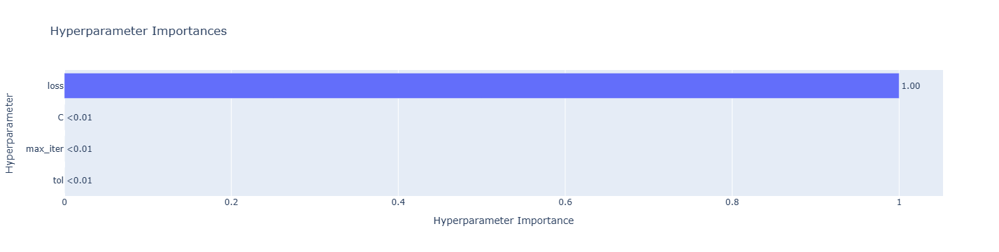

In [22]:
optuna.visualization.plot_param_importances(study)

We can extract from these plots that best configurations have in common loss = hinge, which is the most impoartant hyperparameter. Best configurations also have high values for C but this hyperparameter is not important for the configuration.

## Non-Linear SVC

In [16]:
from cuml.svm import SVC as cuSVC 

For the SelectFromModel we are using the linear kernel

In [17]:
svm_classifier = cu_svc()
selector = SelectFromModel(estimator=svm_classifier).fit(X_scaled, y)
X_selected = selector.transform(X_scaled)

In [18]:
adasyn = ADASYN()
X_resampled, y_resampled = adasyn.fit_resample(X_selected, y)

Tune hyperparameters with optuna

In [26]:
def objective(trial):
    gc.collect()
    cp._default_memory_pool.free_all_blocks()
    
    C = trial.suggest_float('C', 1e-5, 1e2,log=True)
    gamma = trial.suggest_float('gamma', 1e-5, 1e2,log=True)
    tol = trial.suggest_float('tol', 1e-5, 1e-1, log=True)
    max_iter = trial.suggest_int('max_iter', 100, 1000)
    kernel = trial.suggest_categorical('kernel', ['rbf', 'poly', 'sigmoid'])

    svm_classifier = cuSVC(C=C, tol=tol, max_iter=max_iter, kernel=kernel, gamma = gamma)

    scoring = {'roc_auc': 'roc_auc', 'precision': 'precision', 'recall': 'recall'}
    cv_results = cross_validate(
        svm_classifier,
        X_resampled,
        y_resampled,
        cv=5,
        scoring=scoring,
        return_train_score=False
    )

    mean_roc_auc = cv_results['test_roc_auc'].mean()
    mean_precision = cv_results['test_precision'].mean()
    mean_recall = cv_results['test_recall'].mean()

    metric = np.mean([mean_roc_auc, mean_precision, mean_recall])

    return metric

study = optuna.create_study(direction='maximize', study_name="non-linear svc")
study.optimize(objective, n_trials=10)

[I 2024-12-22 17:54:33,455] A new study created in memory with name: non-linear svc
[I 2024-12-22 18:06:51,802] Trial 0 finished with value: 0.5187932801335912 and parameters: {'C': 0.003108309667212533, 'gamma': 84.53724117818226, 'tol': 9.323230959055395e-05, 'max_iter': 583, 'kernel': 'poly'}. Best is trial 0 with value: 0.5187932801335912.
[I 2024-12-22 18:14:01,228] Trial 1 finished with value: 0.5657384050905279 and parameters: {'C': 0.0011829447745600836, 'gamma': 43.046069856568046, 'tol': 0.047275096730138355, 'max_iter': 914, 'kernel': 'sigmoid'}. Best is trial 1 with value: 0.5657384050905279.
[I 2024-12-22 18:19:34,655] Trial 2 finished with value: 0.48214331687606665 and parameters: {'C': 49.53616513965382, 'gamma': 0.0003381463882934937, 'tol': 0.00120853125882998, 'max_iter': 901, 'kernel': 'sigmoid'}. Best is trial 1 with value: 0.5657384050905279.
[I 2024-12-22 18:23:11,474] Trial 3 finished with value: 0.8159655463510358 and parameters: {'C': 2.0421600090633855e-05, '

Train the model with the best found hyperparameters and compute the evaluation metrics with the test set.

In [30]:
model = cuSVC(**study.best_params)
metrics = ClassificationMetricsCV(model,X_resampled,y_resampled)
metrics.save_model("../models/nonLinearSVC.pkl")

In [26]:
model = joblib.load("../models/nonLinearSVC.pkl")
metrics = ClassificationMetricsCV(model,X_resampled,y_resampled)
metrics.stratifiedKfold()
metrics.save_results("Non-Linear SVC")
metrics.printMetrics()

accuracy: 0.9572
error_rate: 0.0428
recall: 0.9161
precision: 0.9988
f1_score: 0.9556
roc_auc: 0.9575


This model presents very good metrics, highlighting a precision of almost 1. From this model we can extract that there is not a linear relationship between features since the metrics for linear svc are really poor but with an rbf kernel the performance improves drastically.

#### STUDY RESULTS

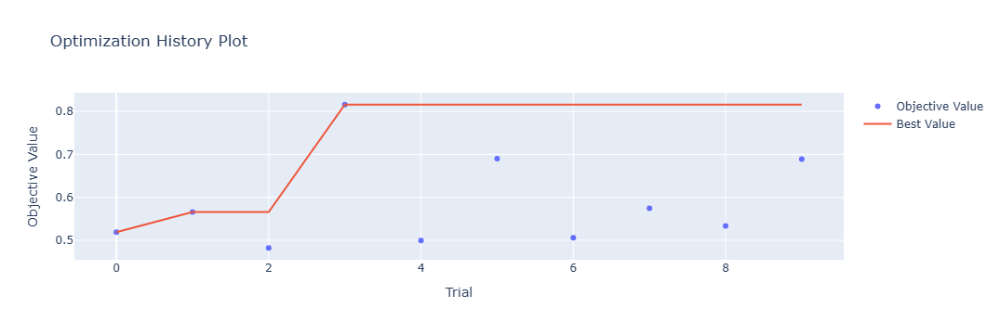

In [31]:
optuna.visualization.plot_optimization_history(study)

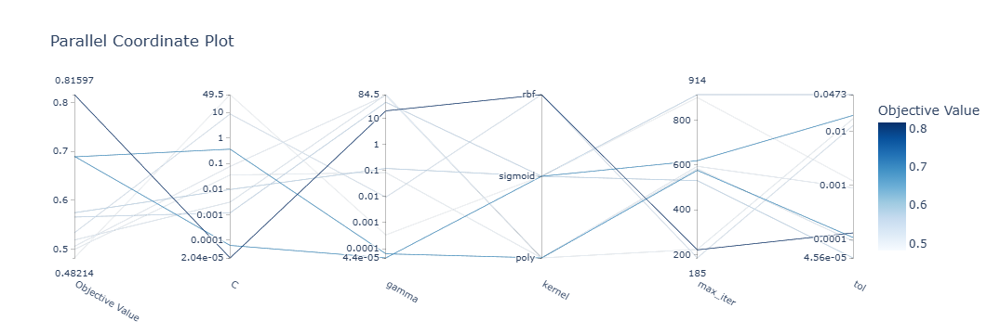

In [32]:
optuna.visualization.plot_parallel_coordinate(study)

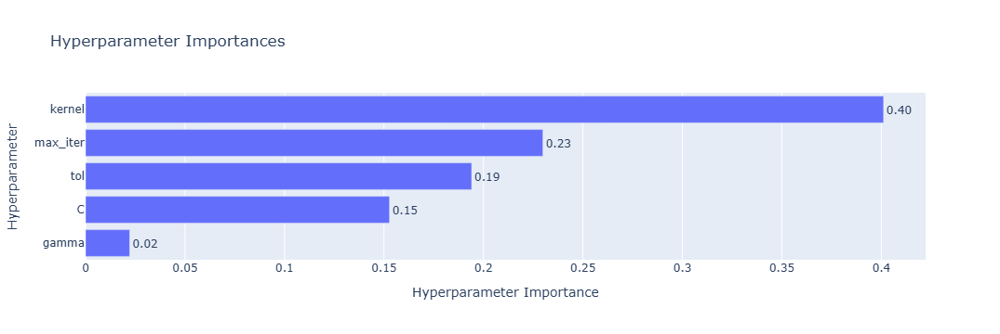

In [33]:
optuna.visualization.plot_param_importances(study)

Before plotting this, we knew that for finding a useful SVC we needed to discover which kernel is the best so in that sense, this plot is not providing any additional information. Nevertheless, we find that max_iter and tol are very important too.

## CART

In [20]:
cart = DecisionTreeClassifier()
selector = SelectFromModel(estimator=cart).fit(X_scaled, y)
X_selected = selector.transform(X_scaled)

Balancing the dataset using ADASYN


In [21]:
adasyn = ADASYN()
X_resampled, y_resampled = adasyn.fit_resample(X_selected, y)

#### HYPERPARAMETER TUNING


In [38]:
def objective(trial):
    criterion = trial.suggest_categorical('criterion', ['gini', 'entropy','log_loss'])
    min_samples_split = trial.suggest_int('min_samples_split', 2, 20)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 20)
    max_features = trial.suggest_categorical('max_features', [None, 'sqrt', 'log2'])
    class_weight = trial.suggest_categorical('class_weight', ['balanced', None])

    cart = DecisionTreeClassifier(criterion = criterion, min_samples_split = min_samples_split, min_samples_leaf=min_samples_leaf, max_features=max_features, class_weight=class_weight, random_state=42)

    scoring = {'roc_auc': 'roc_auc', 'precision': 'precision', 'recall': 'recall'}
    cv_results = cross_validate(
        cart,
        X_resampled,
        y_resampled,
        cv=5,
        scoring=scoring,
        return_train_score=False
    )

    mean_roc_auc = cv_results['test_roc_auc'].mean()
    mean_precision = cv_results['test_precision'].mean()
    mean_recall = cv_results['test_recall'].mean()

    metric = np.mean([mean_roc_auc, mean_precision, mean_recall])

    return metric

study = optuna.create_study(direction='maximize', study_name="cart")
study.optimize(objective, n_trials=20)

[I 2024-12-22 19:26:19,391] A new study created in memory with name: cart
[I 2024-12-22 19:26:31,437] Trial 0 finished with value: 0.8167270609888991 and parameters: {'criterion': 'gini', 'min_samples_split': 18, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'class_weight': None}. Best is trial 0 with value: 0.8167270609888991.
[I 2024-12-22 19:26:41,498] Trial 1 finished with value: 0.8271184637794752 and parameters: {'criterion': 'gini', 'min_samples_split': 11, 'min_samples_leaf': 3, 'max_features': 'log2', 'class_weight': 'balanced'}. Best is trial 1 with value: 0.8271184637794752.
[I 2024-12-22 19:27:31,588] Trial 2 finished with value: 0.8706321584814741 and parameters: {'criterion': 'log_loss', 'min_samples_split': 14, 'min_samples_leaf': 8, 'max_features': None, 'class_weight': None}. Best is trial 2 with value: 0.8706321584814741.
[I 2024-12-22 19:27:43,000] Trial 3 finished with value: 0.8299186292733896 and parameters: {'criterion': 'entropy', 'min_samples_split': 6, 'min_s

#### METRICS

In [42]:
model = DecisionTreeClassifier(**study.best_params)
metrics = ClassificationMetricsCV(model,X_resampled,y_resampled)
metrics.save_model("../models/cart.pkl")

In [22]:
model = joblib.load("../models/cart.pkl")
metrics = ClassificationMetricsCV(model,X_resampled,y_resampled)
metrics.stratifiedKfold()
metrics.save_results("CART")
metrics.printMetrics()

accuracy: 0.8749
error_rate: 0.1251
recall: 0.8728
precision: 0.8781
f1_score: 0.8754
roc_auc: 0.8749


According to this metrics, our model performs very good. It has very balanced metrics.

#### STUDY RESULTS

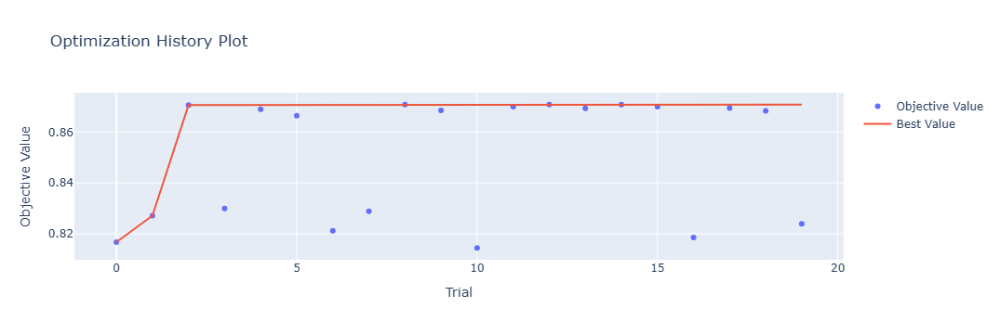

In [39]:
optuna.visualization.plot_optimization_history(study)

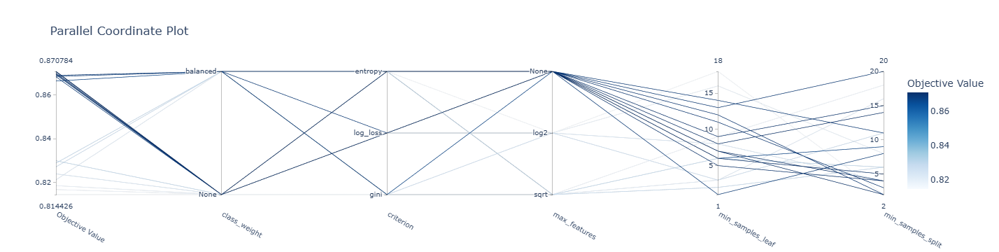

In [40]:
optuna.visualization.plot_parallel_coordinate(study)

In [41]:
optuna.visualization.plot_param_importances(study)

## Conclusion

In [32]:
ClassificationMetricsCV.printResults()

Algorithm,accuracy,error_rate,recall,precision,f1_score,roc_auc
Logistic Regression,0.6479,0.3521,0.6453,0.6502,0.6477,0.6479
Random Forest,0.9614,0.0386,0.9510,0.9716,0.9612,0.9614
Naive Bayes,0.5994,0.4006,0.8744,0.5639,0.6856,0.5996
Linear SVC,0.6728,0.3272,0.6869,0.6704,0.6786,0.6727
Non-Linear SVC,0.9572,0.0428,0.9161,0.9988,0.9556,0.9575
CART,0.8749,0.1251,0.8728,0.8781,0.8754,0.8749


As it is shown in the evaluation of our models, we are not obtaining the best results. We think that this poor performing models can be due to the data. The source of our dataset is a kaggle competition, however we are only using one of the files provided, so we are missing potentially useful data. We are trying to predict default on credit loans and some of the files we are not using contain data about previous loans of bank client, which could improve considerably our predictive power.

In addition, our data is unbalanced, having a lot more 0s than 1s. We are using cuML models that run in the GPU to reduce the computational time. Because of that, we cannot use the hyperparameter class-balance on the models since it is not available so we are using ADASYN algorithm to balance the dataset. Nevertheless, this is possibly not working properly, and it is probably not reflecting the reality with the synthetic data.

In the very first moments, we were obtaining a ROC-AUC, which is definitely a good metric for evaluating classifiers, of 0.51, which means that using our model is not better than guessing our binary target at random. We decided to apply feature engineering techniques such as, outlier elimination, variable normalization and variable creation, to try to improve the results, although we knew they were probably not going to improve a lot since we were not using all the data available. We have manage to turn those 0.51 scores into scores of 0.7, 0.8 and in the case of the best of our models of 0.96, which belongs to the RandomForest Classificator. We want to mention also the outstanding performance of the SVC with RBF kernel.

The worst of our models is Naive Bayes. This model works under the assumption that the features are independent and this happens very rarely. This algorithm does not handle properly non-linearity. We think that this might be the reasons for a bad performance of this model.

On the other hand, this non-linearity is extremely well handled by the SVC with the RBF kernel, which manages to learn the interactions between features and by the RandomForest since it can handle complex relation with the multiple Decision Trees, and by the CART, which also works well for capturing complex relationships in a similar way to Random Forest due to its ability to split the data based on optimal decisions at each node.
